<a href="https://colab.research.google.com/github/romilvikani/Vlg-Project/blob/main/Transfer_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
  !pip install tensorflow-gpu

     |████████████████████████████████| 454.3MB 39kB/s 


In [ ]:
import tensorflow as tf
import os
import pathlib
import io

In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1650082 sha256=8ae770aca98ac1eeae0ae193f5ebc889d7996619249def3b94fba94e9f4750ec
  Stored in directory: /tmp/pip-ephem-wheel-cache-jkyka6p0/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection
  Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [ ]:
from PIL import Image
from six import BytesIO
from IPython.display import Image as IPyImage
from IPython.display import display, Javascript
import numpy as np
import scipy.misc
import glob
import random
import imageio
from object_detection.utils import label_map_util
from object_detection.utils import colab_utils
from object_detection.builders import model_builder
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import config_util
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def convert_image_into_np_array(path):
  path_info = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(path_info))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

def draw_detections(image_np,boxes,classes,scores,category_index,figsize=(12, 16),image_name=None):
  annotated_image_np = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      annotated_image_np,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, annotated_image_np)
  else:
    plt.imshow(annotated_image_np)

In [ ]:
train_image_directory = 'models/research/object_detection/test_images/ducky/train/'
train_images_np=[]

for i in range(1, 6):
  image_path = os.path.join(train_image_directory, 'robertducky' + str(i) + '.jpg')
  train_images_np.append(convert_image_into_np_array(image_path))

In [ ]:
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

In [ ]:
id_of_duck_class = 1
num_classes = 1
category_index = {id_of_duck_class: {'id': id_of_duck_class, 'name': 'rubber_ducky'}}
class_id_decrement = 1

train_images_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
  train_images_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - class_id_decrement)
  gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2021-05-31 17:17:04--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.189.128, 2404:6800:4008:c03::80
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.189.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.1’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M  67.2MB/s    in 3.5s    

2021-05-31 17:17:08 (67.2 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz.1’ saved [244817203/244817203]

mv: cannot move 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint' to 'models/research/object_detection/test_data/checkpoint': Directory not empty


In [ ]:
tf.keras.backend.clear_session()

num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
model_checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head)

fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(model_checkpoint_path).expect_partial()

image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))

prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

In [ ]:
tf.keras.backend.set_learning_phase(True)

batch_size = 4
learning_rate = 0.01
num_batches = 90
array_to_fine_tune = []

trainable_variables = detection_model.trainable_variables

prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']

for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    array_to_fine_tune.append(var)

def get_training_func_of_model(model, optimizer, fine_tune_vars):
  @tf.function
  def training_function(image_tensors,groundtruth_boxes_list,groundtruth_classes_list):
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, fine_tune_vars)
      optimizer.apply_gradients(zip(gradients, fine_tune_vars))
    return total_loss
  return training_function

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
training_function = get_training_func_of_model(detection_model, optimizer, array_to_fine_tune)

for idx in range(num_batches):
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_images_tensors[key] for key in example_keys]


  total_loss = training_function(image_tensors, gt_boxes_list, gt_classes_list)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


batch 0 of 110, loss=0.0039572185


KeyboardInterrupt: ignored

In [ ]:
test_images_directory = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 50):
  image_path = os.path.join(test_images_directory, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(
      convert_image_into_np_array(image_path), axis=0))

@tf.function
def detect(input_tensor):
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

  draw_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

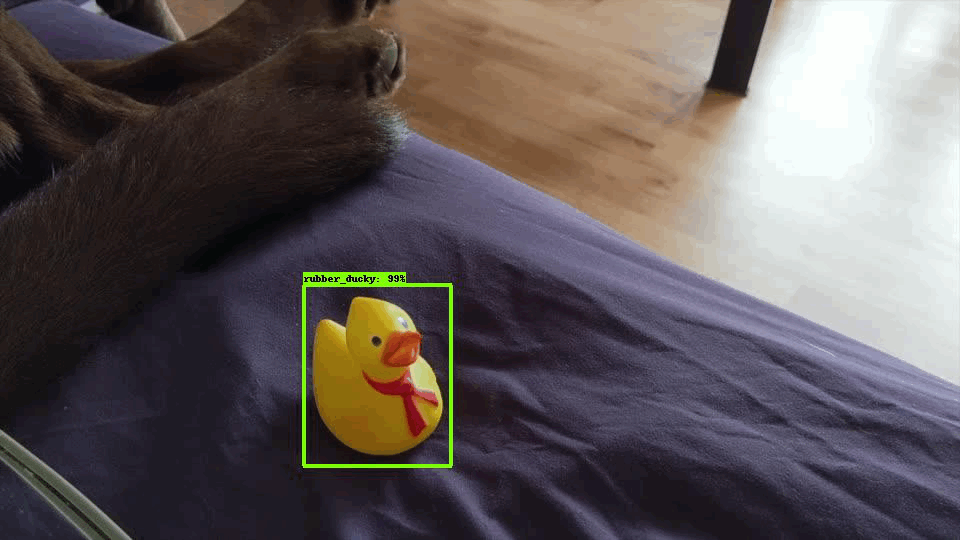

In [ ]:
imageio.plugins.freeimage.download()
gif_file = 'duckies_test.gif'
files = glob.glob('gif_frame_*.jpg')
files = sorted(files)
last = -1
images = []

for file in files:
  image = imageio.imread(file)
  images.append(image)

imageio.mimsave(gif_file, images, 'GIF-FI', fps=7)
display(IPyImage(open(gif_file, 'rb').read()))